### Analyzing Networks Tutorial

In [1]:
import networkx as nx
import DSGRN
from DSGRN import *

import sys
sys.setrecursionlimit(10**8)
sys.path.insert(0,'/home/elizabeth/Desktop/GIT/dsgrn_acdc/src')

from networkx_cond import *
from GradientFun import *

from save_files import *
from get_FG import *
from get_FP_Poset import *
from all_networks_with_n_nodes_e_edges import *
from Anaylizing_cond_functions import *
from metrics import *
from graph_clustering import *
import sys
sys.path.insert(0,'/home/elizabeth/Desktop/GIT/Optimized_Ncut_Directed_and_Undirected/src')
from Clustering_by_weighted_cuts_in_directed_graphs import *

### First, lets just see if the networks product graph has path existance.

all that is needed is a sting input of the network, and it will automatically build and save a network txt file, database and gradient graph. However, if these are already built and you don't want to rebuild them then you can just imput them into the function and run. Below is an example of both options:

In [19]:
# Calling this network similar underlying network or SUN for short.

network = """
Hb : (~Kni)
Gt : (~Kr)   
Kr : (~Kni)(~Gt)
Kni : (~Gt)(~Hb)"""

8640


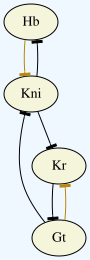

In [20]:
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print(pg.size())
DrawGraph(net)

In [7]:
### First time computing, so I want the function to make the database and compute gradient graph

test_any_path_exists_in_product(network, network_filename='SUN')#8:90, 11:102, 1:162

In [2]:
network_filename = 'SUN'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_SUN"
n = 100

cut = random_sample_of_2_way_cut(network_filename, grad_graph_filename, n)


NameError: name 'Database' is not defined

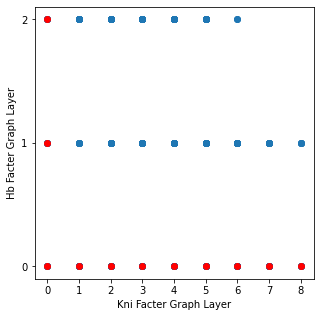

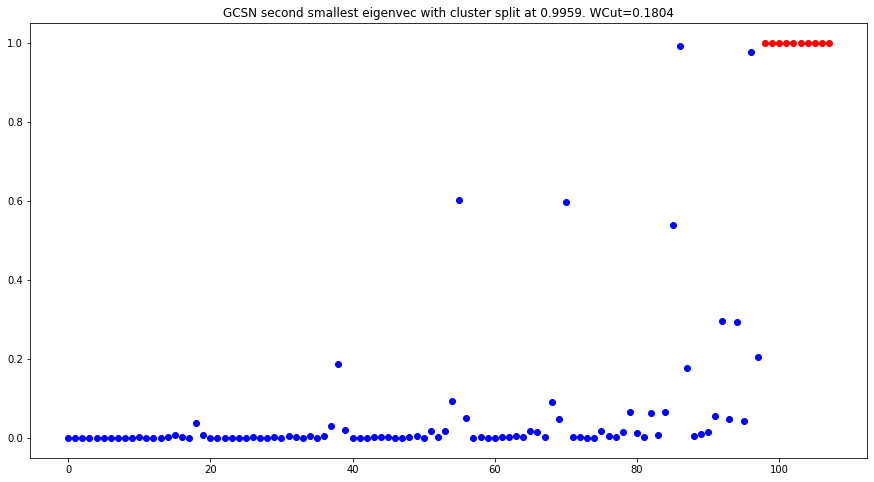

In [79]:
network_filename = 'SUN'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_SUN"
G, cG, diagP, scc = load_G_cG_P_weighted(network_filename, grad_graph_filename)
add_source_weight_to_cond(G, cG, scc)
c, m, C1, C2 = find_best_clustering(diagP, 'GCSN', 15, nodelist = None, data = 'weight', in_out_degree = 'out', save_file = False)

In [80]:
database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"
with open(network_txt_filename,"r") as f:
    network = f.read()

out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Region = get_FP_Poset(out_edges)
FP_Region

{1: ['FP { 1, 2, 0, 0 }', 'FP { 0, 2, 0, 0 }', 'FP { 0, 1, 0, 0 }'],
 2: ['FP { 1, 1, 0, 0 }'],
 3: ['FP { 0, 0, 0, 0 }', 'FP { 1, 0, 1, 0 }', 'FP { 1, 0, 0, 0 }'],
 4: ['FP { 0, 0, 1, 0 }'],
 5: ['FP { 0, 0, 0, 1 }', 'FP { 0, 0, 1, 1 }', 'FP { 0, 0, 1, 2 }'],
 6: ['FP { 0, 0, 0, 2 }'],
 7: ['FP { 0, 1, 0, 1 }', 'FP { 0, 1, 0, 2 }', 'FP { 0, 2, 0, 2 }'],
 8: ['FP { 0, 2, 0, 1 }']}

In [81]:
c = database.conn.cursor()
clusters = defaultdict()

for node in diagP:    
    diagP.nodes()[node]['style'] = 'filled' 
    p = scc[node][0][-1]
    MGI_result = c.execute('select MorseGraphIndex from Signatures where ParameterIndex is ' + str(p))
    MGI = MGI_result.fetchone()[0]

    FP_result = [row[0] for row in c.execute('select Label from MorseGraphAnnotations where MorseGraphIndex is ' + str(MGI))]
    if len(FP_result) == 1:
        for r in FP_Region:
            if FP_result[0] in FP_Region[r]:
                if 'C'+str(r) in clusters:
                    clusters['C'+str(r)] += [node]
                else:
                    clusters['C'+str(r)] = [node] 

In [82]:
def merge_nodes(G,nodes, new_node):
    """
    Merges the selected `nodes` of the graph G into one `new_node`,
    meaning that all the edges that pointed to or from one of these
    `nodes` will point to or from the `new_node`.
    attr_dict and **attr are defined as in `G.add_node`.
    """
    w = nx.get_edge_attributes(G, 'weight')
    
    G.add_node(new_node) # Add the 'merged' node
    edges = list(G.edges()).copy()

    for edge in edges:
        s = edge[0]
        t = edge[1]
        if s in nodes and t not in nodes:
            G.add_edge(new_node,t)
            G[new_node][t]['weight'] = w[s,t]
        elif t in nodes and s not in nodes:
            G.add_edge(s,new_node)
            G[s][new_node]['weight'] = w[s,t]
    
    for n in nodes: # remove the merged nodes
        G.remove_node(n)


In [83]:
edges = list(cG.edges())
for edge in edges:
    s = edge[0]
    t = edge[1]

    if s not in diagP:
        if t not in diagP:
            cG.remove_edge(s,t)

for c in clusters:
    merge_nodes(cG, clusters[c], c)



In [85]:
cG.remove_nodes_from(list(nx.isolates(cG)))

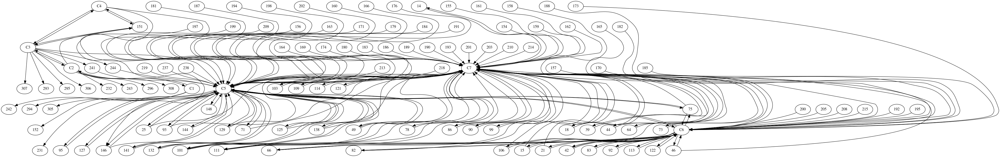

In [88]:
view_clusters(cG, clusters, data = None)

In [81]:
import random
n = 250
V = list(range(0,2000))
random.shuffle(V)
C = [V[i:i + n] for i in range(0, len(V), n)] 

G = nx.DiGraph()
for k in range(len(C)-1):
    for s in C[k]:
        for t in C[k+1]:
            G.add_edge(s,t)
            G[s][t]['weight']=1

for k in range(len(C)-1):
    for s in C[k]:
        for t in C[k]:
            if s != t:
                G.add_edge(s,t)
                G[s][t]['weight']=1

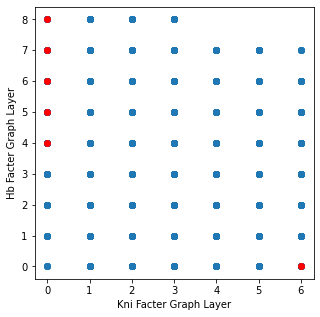

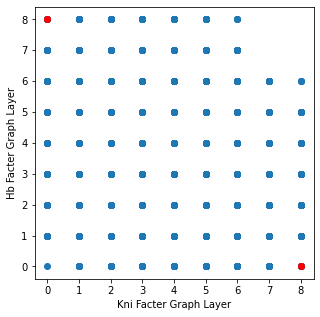

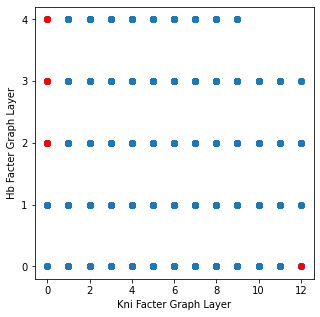

In [226]:
network_filename = 'BNFL'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_BNFL"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 
#------------------
network_filename = 'FullConn'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_FullConn"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 
#------------------
network_filename = 'StrongEdges'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_StrongEdges"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 



In [ ]:
network_filename = 'FullConn'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_FullConn"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 
#-------------
network_filename = 'StrongEdges'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_StrongEdges"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 



KeyboardInterrupt: 

In [224]:
network_filename = 'StrongEdges'
grad_graph_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_StrongEdges"

database_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".db"
database = Database(database_filename) 
network_txt_filename = "/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/" + network_filename + ".txt"

with open(network_txt_filename,"r") as f:
    network = f.read()

grad_graph = grad_graph = load_json(grad_graph_filename)

out_edges = get_number_out_edges_from_string(network)
FP_Poset = get_FP_Poset(out_edges)[0]
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)

N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

add_source_weight_to_cond(G, N, scc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
P = get_product_graph(database, N, scc, FP_Poset)
#print('prod size', len(P), len(P.edges()))

breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
diagP = remove_unnecessary_nodes_in_P(P, breaks, keep, scc, Kni_max)

Y, cut, clusters = asym_optimized_normalized_cut(diagP, 2, nodelist = None, data = 'weight', in_out_degree='out')
#print('WCut_P', cut)

import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
plt.title(network_filename + ' kmeans cut '+str(round(cut,4)))
plt.savefig(network_filename + '_kmeans_cut_'+str(round(cut,4))+ '_diagP.png')   # save the figure to file
plt.close() 

eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    #print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 


KeyboardInterrupt: 

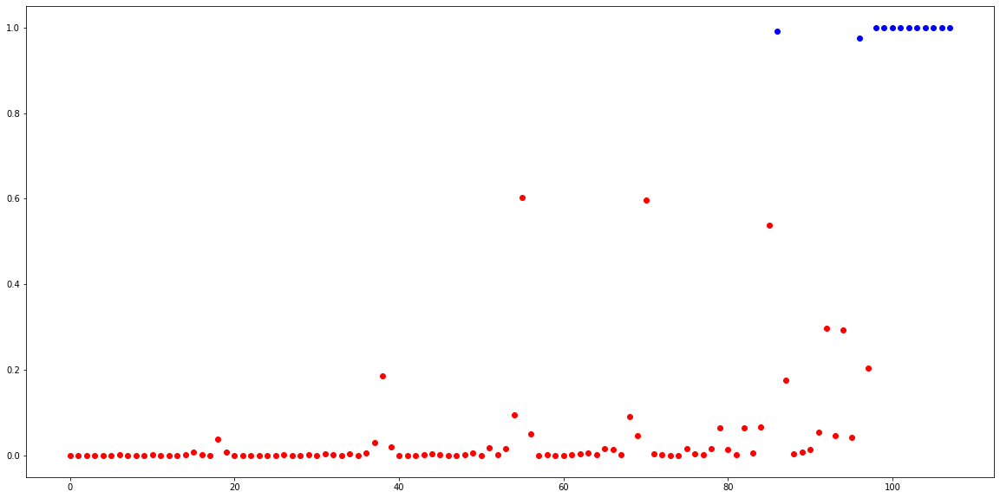

In [212]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))

T = list(diagP.nodes())
eig_vec2 = Y[:,1]

# This line below plots the 2d points
#plt.scatter(np_array[:,0], np_array[:,1])
for i in diagP.nodes():
    if i in clusters[0]:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        #print(list(diagP.nodes())[i])
    else:
        plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')

plt.show()

In [214]:
eigv = sorted(Y[:,1])
diff = []
for i in range(len( eigv )-1):
    diff.append( ( abs(eigv[i] - eigv[i+1]) , eigv[i], eigv[i+1] ) ) 

diff.sort(key=lambda a: a[0])
diff[-5:]

[(0.05890011255223837, 0.5376561212651697, 0.5965562338174081),
 (0.08221389526666843, 0.09354506236558761, 0.17575895763225605),
 (0.08898526309529647, 0.20301389737993564, 0.2919991604752321),
 (0.24170825669538615, 0.29594786456978356, 0.5376561212651697),
 (0.3741736562329865, 0.6020356252919987, 0.9762092815249852)]

In [218]:
T = list(diagP.nodes())
eig_vec2 = Y[:,1]

for t in diff[-15:]:
    C1 = []
    C2 = []
    m = t[1] + (t[2]-t[1])/2
    for n in diagP.nodes():
        index = list(diagP.nodes()).index(n)
        if Y[:,1][index] >= m:
            C1.append(n)
        else:
            C2.append(n)
    cluster_list = [C1, C2]
    c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
    print(c,m,t)
    plt.figure(figsize=(20, 10))
    for i in diagP.nodes():
        if i in C1:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'r')
        else:
            plt.scatter(x=list(diagP.nodes()).index(i), y=eig_vec2[list(diagP.nodes()).index(i)], color = 'b')
    plt.title(network_filename + ' second smallest eigenvec with cluster split at ' + str(round(m,4)) + '. WCut='+str(round(c,4)))

    plt.savefig(network_filename + 'cluster_split_at_' + str(round(m,4)) + '_cut_'+str(round(c,4))+ '_diagP.png')   # save the figure to file
    plt.close() 



0.4247113055302165 0.05201663231224318 (0.004888788493439912, 0.04957223806552323, 0.05446102655896314)
0.3427120763260855 0.5992959295547033 (0.005479391474590645, 0.5965562338174081, 0.6020356252919987)
0.1803547187168284 0.9959094290907933 (0.007883310315496272, 0.9919677739330451, 0.9998510842485414)
0.4226556470666059 0.03344115959749384 (0.00808977814506039, 0.02939627052496364, 0.03748604867002403)
0.4367564175843274 0.05880362856292648 (0.008685204007926682, 0.05446102655896314, 0.06314623056688982)
0.4217184744725442 0.1804317062870071 (0.009345497309502127, 0.17575895763225605, 0.18510445494175817)
0.39780655544672566 0.02402342134927138 (0.01074569835138452, 0.01865057217357912, 0.02939627052496364)
0.22765078316463833 0.9840885277290152 (0.015758492408059932, 0.9762092815249852, 0.9919677739330451)
0.46801623795093833 0.1940591761608469 (0.017909442438177464, 0.18510445494175817, 0.20301389737993564)
0.45455232122340566 0.07742533757919431 (0.023895248625585383, 0.065477713

In [184]:
cluster_list = [C1, C2]
c = normalized_cut(diagP, cluster_list, nodelist = None, data = 'weight')
c

0.06108115032051724

In [85]:
normalized_cut(diagP, list(clusters.values()), nodelist = None, data = 'weight')

0.30673111066507613

In [148]:
list(Y[:,1])[0]

-0.0009030134661673284

In [62]:
diagP.in_degree(0)

6

In [69]:
diagP.in_edges(0)

InEdgeDataView([(3, 0), (7, 0), (58, 0), (67, 0), (284, 0), (1579, 0)])

In [86]:
w = nx.get_edge_attributes(diagP, 'weight')

In [110]:
C1 = clusters[0]
C2 = clusters[1]

In [111]:
C1

[124, 145, 150, 153, 245, 248, 246, 247, 309, 312, 311, 310]

In [112]:
assos_A_V = 0
for u in C1:
    for t in diagP.nodes():
        if (u,t) in diagP.edges():
            assos_A_V += w[u,t]
assos_A_V

6.52723386260331

In [113]:
assos_B_V = 0
for u in C2:
    for t in diagP.nodes():
        if (u,t) in diagP.edges():
            assos_B_V += w[u,t]
assos_B_V

72.28847521822419

In [116]:
cut_A_B = 0
for u in C1:
    for t in C2:
        if (u,t) in diagP.edges():
            cut_A_B += w[u,t]
cut_A_B

1.9130434782608692

In [117]:
NCut = (cut_A_B/assos_A_V) + (cut_A_B/assos_B_V)
NCut

0.3195504181077957

In [72]:
sum(w[e[0],e[1]] for e in diagP.in_edges(0) )

4.445128767119046

In [70]:
diagP.out_edges(0)

OutEdgeDataView([])

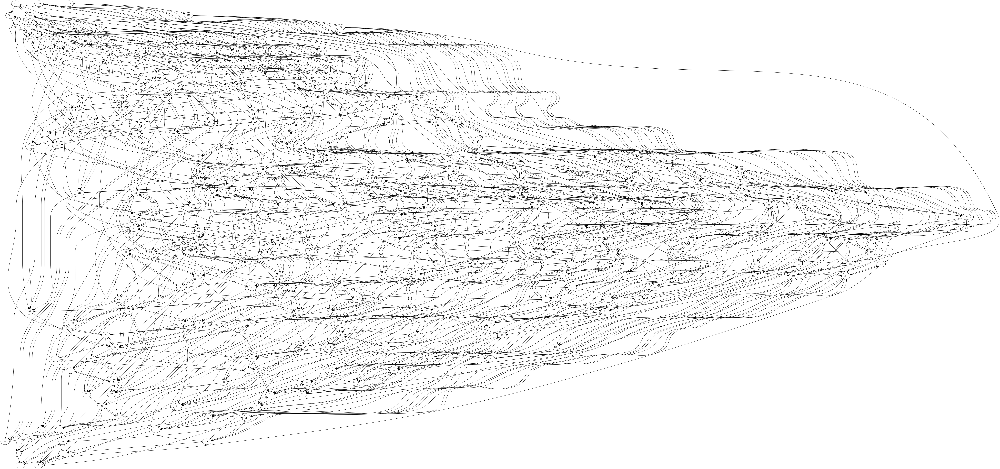

In [ ]:
from IPython.display import Image, display
view_pydot(cG, data = None)

In [ ]:
N = nx.DiGraph()
for node in cG:
    N.add_node(node)
    for edge in cG[node]:
        N.add_edge(node, edge)

In [ ]:
add_source_weight_to_cond(G, N, scc)

In [ ]:
def avg_two_way_edge_weight_for_OpenOrd(cG, data = 'weight'):
    weight = nx.get_edge_attributes(cG, data)
    edges = cG.edges()
    for s,t in edges:
        if (t,s) in edges:
            w1 = weight[s,t]
            w2 = weight[t,s]
            avg_w = (w1+w2)/2
            cG[s][t]['weight'] = avg_w
            cG[t][s]['weight'] = avg_w
    return cG

In [ ]:
import networkx as nx
start_set, stop_set = return_start_stop_set(database, diagP, scc, Hb_max, Kni_max, FP_Regions)
print(start_set, stop_set)
create_cond_subgraphs_graphml(database, N, diagP.nodes(), [], scc, FP_Regions, start_set, stop_set, 'test.graphml')

[309, 311] [0, 1]


In [ ]:
W = asym_weight_matrix(cG, nodelist = None, data = 'weight')

In [ ]:
nodelist = list(cG.nodes())
W[nodelist.index(273)][nodelist.index(274)], W[nodelist.index(274)][nodelist.index(273)]

(0.20238095238095238, 0.20238095238095238)

In [ ]:
nx.write_graphml(N, 'test.graphml')

In [ ]:
get_gephi_graph_for_cond(database, network, G, graphml_filename, path_nodes = [])

In [ ]:
nodelist = list(sorted(P.nodes()))
data = None
k = 8

Y, cut, clusters = asym_optimized_normalized_cut(P, k, nodelist, data)
cut

2.573724265789428

In [ ]:
c = database.conn.cursor()
region = 2
rG = nx.Graph()
P = deepcopy(G)
start_set = []
for node in G:
    if node[0] == 0 and node[1] == 0:
        start_set.append(node)

del_list = []
for node in P.nodes():
    for i in start_set:
        if node not in start_set:
            try:
                nx.shortest_path(P, i, node)
                break
            except:
                if i == start_set[-1]:
                    del_list.append(node)
                    break
                else:
                    continue

for node in del_list:   
    P.remove_node(node)

for edge in P.edges():
    #if scc == None:
    s = edge[0][-1]
    t = edge[1][-1]
    #else:
        #s = scc[edge[0]][0][-1]
        #t = scc[edge[1]][0][-1]

    sMGI = c.execute('select MorseGraphIndex from Signatures where ParameterIndex is ' + str(s))
    MGI = sMGI.fetchone()[0]
    sFP = [row[0] for row in c.execute('select Label from MorseGraphAnnotations where MorseGraphIndex is ' + str(MGI))]

    tMGI = c.execute('select MorseGraphIndex from Signatures where ParameterIndex is ' + str(t))
    MGI = tMGI.fetchone()[0]
    tFP = [row[0] for row in c.execute('select Label from MorseGraphAnnotations where MorseGraphIndex is ' + str(MGI))]

    if R[sFP[0]] == region and R[tFP[0]] == region:
        rG.add_edge(edge[0], edge[1])


In [ ]:
nodelist = sorted(diagP.nodes())
data = 'weight'
Y, cut, clusters = asym_optimized_normalized_cut(diagP, 6, nodelist, data)
cut

1.3264627906457247

In [122]:
list(diagP.nodes())

[0,
 3,
 1,
 2,
 4,
 7,
 5,
 6,
 8,
 10,
 9,
 11,
 12,
 16,
 13,
 17,
 19,
 20,
 22,
 23,
 26,
 28,
 27,
 29,
 30,
 33,
 31,
 32,
 34,
 36,
 35,
 37,
 38,
 40,
 41,
 43,
 45,
 47,
 48,
 51,
 52,
 53,
 55,
 54,
 56,
 59,
 57,
 58,
 60,
 61,
 62,
 63,
 68,
 65,
 67,
 70,
 72,
 76,
 74,
 77,
 81,
 79,
 80,
 87,
 84,
 85,
 88,
 89,
 91,
 97,
 94,
 98,
 102,
 100,
 105,
 104,
 107,
 108,
 112,
 110,
 116,
 117,
 115,
 118,
 119,
 120,
 124,
 126,
 131,
 130,
 133,
 134,
 137,
 139,
 140,
 142,
 145,
 149,
 150,
 153,
 245,
 248,
 246,
 247,
 309,
 312,
 311,
 310]

In [123]:
clusters[0]

[124, 145, 150, 153, 245, 248, 246, 247, 309, 312, 311, 310]

In [121]:
Y

array([[-9.99999592e-01, -9.03013466e-04],
       [-9.99999789e-01, -6.50076307e-04],
       [-9.99999394e-01, -1.10050819e-03],
       [-9.99999936e-01, -3.57942794e-04],
       [-9.99999350e-01, -1.14058482e-03],
       [-9.99999580e-01, -9.16440113e-04],
       [-9.99999997e-01,  8.24925125e-05],
       [-9.99999869e-01, -5.12053562e-04],
       [-9.99999347e-01, -1.14286185e-03],
       [-9.99999620e-01, -8.71801950e-04],
       [-9.99999406e-01,  1.09005847e-03],
       [-9.99999974e-01, -2.26721027e-04],
       [-9.99999988e-01, -1.53351554e-04],
       [-9.99999689e-01, -7.89039126e-04],
       [-9.99999447e-01,  1.05193835e-03],
       [-9.99972342e-01,  7.43739858e-03],
       [-9.99999194e-01,  1.26958865e-03],
       [-9.99999789e-01, -6.49130877e-04],
       [-9.99297151e-01,  3.74860487e-02],
       [-9.99975191e-01,  7.04397122e-03],
       [-9.99999328e-01, -1.15967783e-03],
       [-9.99999540e-01, -9.59390752e-04],
       [-9.99999995e-01, -9.96619198e-05],
       [-9.

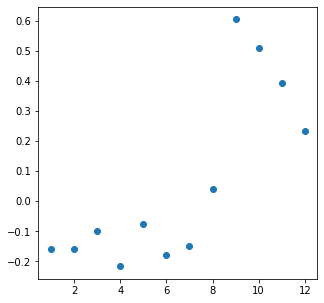

In [ ]:
plt.figure(figsize=(5,5))
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.yaxis.set_major_locator(MaxNLocator(integer=True))


plt.scatter(x = range(1,len(v2)+1), y = v2)

plt.show()

In [ ]:
iX2 = indicator_vector(X[:,1])
print(len(iX2[0]))
WCut(D, W, D, iX2)

2


0.21428571428571427

In [ ]:
def mutual_connection_matrix(W):
    M = np.minimum(W, W.transpose())
    return M

def node_out_degree(G, node, weight = None):

    edges = [n for n in G.neighbors(node)]
    
    if weight == None:
        d = len(edges)
    else:
        d = 0
        for n in edges:
            try:
                d += weight[node, n]
            except:
                continue
    return d

def mutual_random_connection_matrix(G, nodelist, data = None):

    if data == None:
        weight = None
    else:
        weight = nx.get_edge_attributes(G, data)

    nlen = len(G)
    index = dict(zip(nodelist, range(nlen)))

    rM = np.full((nlen, nlen), np.nan, order=None)

    for i in nodelist:
        for j in G.neighbors(i):
            if i != j:
                di = node_out_degree(G, i, weight =weight)
                dj = node_out_degree(G, j, weight =weight)
                rM[index[i], index[j]] = (di*dj)/((nlen - 1)**2)
            else:
                rM[index[i], index[j]] = 0

    rM[np.isnan(rM)] = 0
    rM = np.asarray(rM, dtype=None)
    return rM

def mutuality_tendency_matrix(M, rM):
    T = M-rM
    return T

def mutuality_tendency_laplacian_matrix(M, rM):
    T = M-rM
    D = np.diag(T.sum(axis = 1))
    L = D - T
    return L
    

In [ ]:
save_networkx_as_png_w_edge_weight(diagP, 'weight', 'FP_Poset.png')

In [ ]:
R = {}
for i in FP_Regions:
    for j in FP_Regions[i]:
        R[j] = i

c = database.conn.cursor()

Region_count = {}
for edge in G.edges():
    
    s = edge[0][-1]
    t = edge[1][-1]

        #s = scc[edge[0]][0][-1]
        #t = scc[edge[1]][0][-1]

    sMGI = c.execute('select MorseGraphIndex from Signatures where ParameterIndex is ' + str(s))
    MGI = sMGI.fetchone()[0]
    sFP = [row[0] for row in c.execute('select Label from MorseGraphAnnotations where MorseGraphIndex is ' + str(MGI))]

    tMGI = c.execute('select MorseGraphIndex from Signatures where ParameterIndex is ' + str(t))
    MGI = tMGI.fetchone()[0]
    tFP = [row[0] for row in c.execute('select Label from MorseGraphAnnotations where MorseGraphIndex is ' + str(MGI))]

    if R[sFP[0]]!=R[tFP[0]]:
        if (R[sFP[0]], R[tFP[0]]) not in Region_count:
            Region_count[(R[sFP[0]], R[tFP[0]])] = 1
        else:
            Region_count[(R[sFP[0]], R[tFP[0]])] += 1


out = {}
for i in range(1,9):
    out[i] = 0
    for r in Region_count:
        if r[0] == i:
            out[i] += Region_count[r]

RG = nx.DiGraph()
for i in Region_count:
    RG.add_edge(i[0], i[1], weight = Region_count[i]/out[i[0]]) 

simple = [p for p in nx.all_simple_paths(RG, 1, 8)]
simple[0]

[1, 3, 4, 5, 7, 8]

In [ ]:
score_region_transitions(database, G, FP_Regions)

0.3326133909287257
0.1732283464566929
0.3443708609271523
0.8541666666666666
0.7456647398843931
0.5039164490861618
0.33530571992110453


(0.4698951676958424, 0.0021353585566813733, 1.0)

In [ ]:
count = 0
for i in out:
    count += out[i]
count

2523

In [ ]:
graphml_filename =  "SUN_source.graphml"
get_gephi_graph_for_cond(database, network, G, graphml_filename)

Path exists from 309 to 0


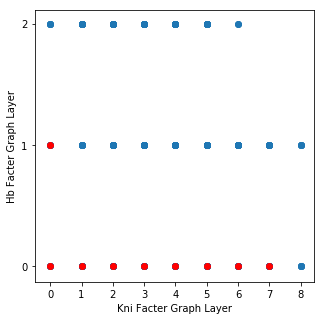

True

In [ ]:
### Now that I have computed this once, I dont have to recompute the database or the gradient graph, so I put them in the function

grad_graph = load_json("grad_graph_strict_SUN")
database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/SUN.db") 

test_any_path_exists_in_product(network, 'SUN', database = database, grad_graph = grad_graph)

### Now lets take a look a larger network
This will take an hour or two to compute the gradient graph, so saving it in the process is helpful.

In [ ]:
network = """
Hb : (Kr+Gt)(~Kni)
Gt : (~Kr)(Kni)   
Kr : (~Kni)(~Hb)
Kni : (~Gt)"""

1920000


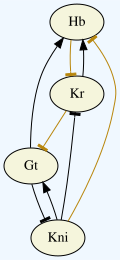

In [ ]:
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print(pg.size())
DrawGraph(net)

Path exists from 4179 to 1


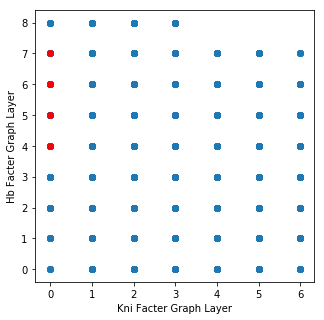

True

In [ ]:
# Calling this one breaking negative feedback loops or BNFL for short

test_any_path_exists_in_product(network, network_filename='BNFL') #took 9 min 

pg size 1920000
grad size 392232
r grad size 392232 3250260
cond size 4185 23646
prod size 953 3658


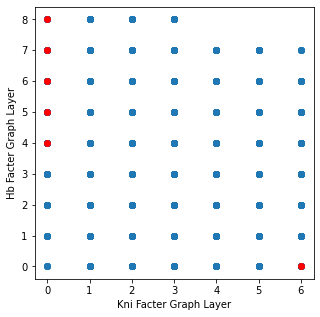

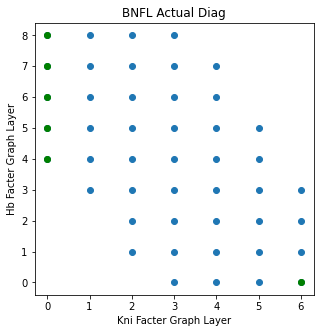

(1, 0) (0, 0)
(2, 0) (1, 0)
(3, 0) (2, 0)
(4, 0) (3, 0)
99 854


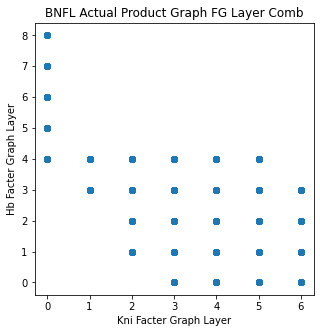

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/BNFL.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_BNFL")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/BNFL.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
print('r grad size', len(G), len(G.edges()))

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)
print('cond size', len(cG), len(cG.edges()))

P = get_product_graph(database, cG, scc, FP_Poset)
print('prod size', len(P), len(P.edges()))


Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
plot_FG_layer_comb(keep, Hb_max, breaks, 'BNFL Actual Diag')

for b in breaks:
    if (b[0]-1,b[1]) in breaks:
        print(b, (b[0]-1,b[1]))
        for k in range(b[1]+1, Kni_max+1):
            try:
                keep.remove((b[0]-1, k))
            except:
                KeyError
    if b[1]<Kni_max:
        for h in range(b[0]):
            try:
                keep.remove((h, k+1))
            except:
                KeyError

del_list = []
for node in P:
    if scc[node][0][0:2] not in keep:
        del_list.append(node)

for node in del_list:
    P.remove_node(node)

print(len(del_list), len(P))
plot_FG_layer_comb_in_G(P, scc, Hb_max, 'BNFL Actual Product Graph FG Layer Comb')

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/BNFL.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_BNFL")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/BNFL.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
score_region_transitions(database, G, FP_Regions)

pg size 1920000
grad size 392232
0.4786832164058284
0.530526749536433
0.2803370786516854
0.7186799755551029
0.7658719607669355
0.6723524025907965
0.2990257520510483


(0.5350681622225472, 0.007878314192349682, 1.0)

In [ ]:
graphml_filename =  "BNFL_source.graphml"
get_gephi_graph_for_cond(database, network, G, graphml_filename)

### Now we can look at any network of a specific number of nodes and edges

First I construct a list containing tuples. Each tuple represents a different graph, the first element of the tuple is the graph edges and the seconds is what sign each of those edges has. Making the convention that a 0 is a repressing edge and a 1 is an activating edge. 

In [4]:
node_list = ['Hb', 'Gt', 'Kr', 'Kni']

all_network_comb = get_all_networks(node_list, 8)
len(all_network_comb)

126720

In [5]:
all_network_comb[0]

((('Hb', 'Gt'),
  ('Hb', 'Kr'),
  ('Hb', 'Kni'),
  ('Gt', 'Hb'),
  ('Gt', 'Kr'),
  ('Gt', 'Kni'),
  ('Kr', 'Hb'),
  ('Kr', 'Gt')),
 [0, 0, 0, 0, 0, 0, 0, 0])

Once we get the set of networks, we need to know how many are computable by DSGRN.

In [6]:
computable = computable_networks(all_network_comb) #Takes 5 min to run
len(computable)

117504

In [7]:
d = defaultdict(list)

for k, v in computable:
    d[v].append(k)

for i in sorted(d):
    print(i, len(d[i]))

1440000 1536
1920000 9216
2160000 6144
2560000 2304
2880000 24576
3240000 3072
4320000 11520
4464000 6912
5760000 11520
5952000 6912
6480000 3840
6696000 2304
9162720 1920
9797760 1152
10800000 3840
11160000 2304
12216960 5760
12960000 1200
13063680 3456
13392000 1440
13838400 432
20361600 1920
21600000 1200
21772800 1152
22320000 1440
23064000 432


Of the computable networks, how many have a small enough Parameter Graph? Currently defalted to PG size of StrongEdges.

In [8]:
allowed = return_computable_net_w_limited_PG_size(computable) # returns list of INDEX's of networks in all_network_comb
len(allowed)

46848

In [11]:
all_network_comb[allowed[0]][0]

(('Hb', 'Gt'),
 ('Hb', 'Kr'),
 ('Hb', 'Kni'),
 ('Gt', 'Hb'),
 ('Gt', 'Kr'),
 ('Gt', 'Kni'),
 ('Kr', 'Kni'),
 ('Kni', 'Kr'))

In [13]:
network_list = []
count = 0
for n in allowed:
    network_list.append((count, all_network_comb[n][0], all_network_comb[n][1]))
    count+=1
network_list[5]

(5,
 (('Hb', 'Gt'),
  ('Hb', 'Kr'),
  ('Hb', 'Kni'),
  ('Gt', 'Hb'),
  ('Gt', 'Kr'),
  ('Gt', 'Kni'),
  ('Kr', 'Kni'),
  ('Kni', 'Kr')),
 [0, 0, 0, 0, 0, 1, 0, 1])

In [28]:
import random

random_network_sample = random.sample(network_list, 2)

[[40379,
  [['Hb', 'Kr'],
   ['Gt', 'Hb'],
   ['Gt', 'Kr'],
   ['Kr', 'Hb'],
   ['Kr', 'Gt'],
   ['Kr', 'Kni'],
   ['Kni', 'Hb'],
   ['Kni', 'Gt']],
  [1, 0, 1, 1, 1, 0, 1, 1]],
 [4482,
  [['Hb', 'Gt'],
   ['Hb', 'Kr'],
   ['Gt', 'Hb'],
   ['Kr', 'Gt'],
   ['Kr', 'Kni'],
   ['Kni', 'Hb'],
   ['Kni', 'Gt'],
   ['Kni', 'Kr']],
  [1, 0, 0, 0, 0, 0, 1, 0]]]

In [14]:
import json
with open('network_file.json', 'w') as f:
    json.dump(network_list, f)

In [15]:
network_list = json.load(open('network_file.json'))

In [17]:
network_list[0:1]

[[0,
  [['Hb', 'Gt'],
   ['Hb', 'Kr'],
   ['Hb', 'Kni'],
   ['Gt', 'Hb'],
   ['Gt', 'Kr'],
   ['Gt', 'Kni'],
   ['Kr', 'Kni'],
   ['Kni', 'Kr']],
  [0, 0, 0, 0, 0, 0, 0, 0]]]

Then you can take a random network from this list, and check if a paths exists like we did at the begining.

In [ ]:
import random

list_network = random.choice(allowed)
print(all_network_comb[list_network])

network = get_network_string(all_network_comb[list_network]) ### Converting the list above to the network written as a string we can use for DSGRN
print(network)

((('Hb', 'Gt'), ('Gt', 'Hb'), ('Gt', 'Kr'), ('Gt', 'Kni'), ('Kr', 'Hb'), ('Kr', 'Gt'), ('Kni', 'Hb'), ('Kni', 'Kr')), [0, 0, 0, 0, 0, 1, 0, 0])
"""Hb : (~Gt)(~Kr)(~Kni)
Gt : (Kr)(~Hb)
Kr : (~Gt)(~Kni)
Kni : (~Gt)"""


2880000


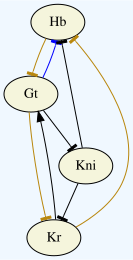

In [ ]:
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print(pg.size())
DrawGraph(net)  

In [ ]:
result = test_any_path_exists_in_product(network, network_filename='Random_Choice_Network') #((('Hb', 'Gt'), ('Gt', 'Hb'), ('Kr', 'Hb'), ('Kr', 'Gt'), ('Kr', 'Kni'), ('Kni', 'Hb'), ('Kni', 'Gt'), ('Kni', 'Kr')), [0, 1, 1, 0, 0, 0, 0, 0])
result

Exception ignored in: <function Database.__del__ at 0x7fcde64623b0>
Traceback (most recent call last):
  File "/home/elizabeth/anaconda3/lib/python3.7/site-packages/DSGRN/Query/Database.py", line 52, in __del__
    self.conn.commit()
sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140523072440128 and this is thread id 140521589167872.


Empty stop set


False

You can also visualize the Fixed Point Poset.

In [ ]:
out_edges = get_number_out_edges_from_string(network)
print(out_edges)

FP_Poset = get_FP_Poset(out_edges)[0]

G = convert_dict_to_networkx(FP_Poset)
save_networkx_as_png(G, 'FP_Poset.png')

{'Hb': 1, 'Gt': 3, 'Kr': 2, 'Kni': 2}


How many networks have the negative feedback like FullConn and StrongEdges?

In [ ]:
edges_needed = [('Hb', 'Kni'), ('Kni', 'Hb'), ('Kr', 'Gt'), ('Gt', 'Kr')]

nets_with_neg_feedback = []
for n in allowed:
    count = 0
    for edge in edges_needed:
        if edge in all_network_comb[n][0]:
            count += 1
            if count == 4:
                nets_with_neg_feedback.append(all_network_comb[n])
                break
len(nets_with_neg_feedback)


9728

Lets see if a network with the negative feedback loops works

1440000


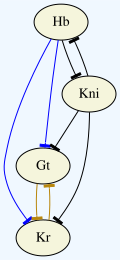

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/Choice_w_neg_feedback_loops.txt',"r") as f:
    network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print(pg.size())
DrawGraph(net)  

In [ ]:
result = test_any_path_exists_in_product(network, network_filename='RNNFL') # grad_graph comp took 9 min!
result

Empty start set


False

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/RNNFL.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_RNNFL")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/RNNFL.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
print('r grad size', len(G), len(G.edges()))

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)
print('cond size', len(cG), len(cG.edges()))

P = get_product_graph(database, cG, scc, FP_Poset)
print('prod size', len(P), len(P.edges()))


pg size 1440000
grad size 562990
r grad size 562990 5525516
cond size 975 4502
prod size 726 2382


In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/RNNFL.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_RNNFL")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/RNNFL.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
score_region_transitions(database, G, FP_Regions)

pg size 1440000
grad size 562990


KeyError: 'FP { 1, 0, 1, 2 }'

In [ ]:
graphml_filename =  "RNNFL_source.graphml"
get_gephi_graph_for_cond(database, network, G, graphml_filename)

### Also, we can look at what Factor Graph combinations are requred on a minimal diagonal.

In [ ]:
database = Database("/home/elizabeth/Desktop/ACDC/ACDC_StrongEdges.db") 
grad_graph = load_json('StrongEdges_grad_graph_new')

In [ ]:
network_txt_filename = '/home/elizabeth/Desktop/ACDC/ACDC_StrongEdges'
with open(network_txt_filename,"r") as f:
        network = f.read()
print(network)

Hb : (Gt)(~Kni)       
Gt : (Kni)(~Kr)       
Kr : (~Kni)(~Gt)      
Kni : (~Hb)(~Gt)



In [ ]:
out_edges = get_number_out_edges_from_string(network)
print(out_edges)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = convert_dict_to_networkx(FP_Poset)
save_networkx_as_png(G, 'FP_Poset.png')

G, ngg  = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)
strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)
Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1

{'Hb': 1, 'Gt': 3, 'Kr': 1, 'Kni': 3}


In [ ]:
P = get_product_graph(database, cG, scc, FP_Poset)
len(P)

4443

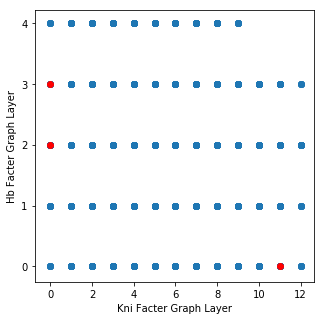

In [ ]:
breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 

In [ ]:
start_set, stop_set = return_start_stop_set(database, P, scc, Hb_max, Kni_max, FP_Regions) 
print(start_set, stop_set)

[7385, 7386] [0, 2, 3]


### Let redo computation of FullConn and StrongEdges

2560000


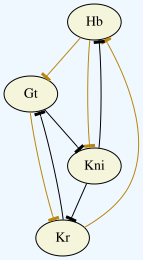

In [4]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.txt',"r") as f:
    network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print(pg.size())
DrawGraph(net) 

Path exists from 5308 to 0


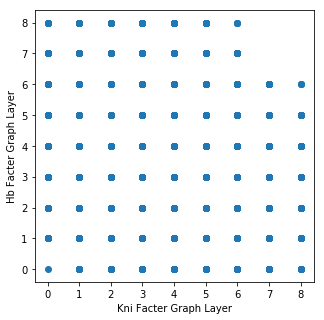

True

In [ ]:
test_any_path_exists_in_product(network, network_filename='FullConn') #Took 12 min to compute grad graph

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_FullConn")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
score_region_transitions(database, G, FP_Regions)

pg size 2560000
grad size 573675


0.6096007777364886

pg size 2560000
grad size 573675
r grad size 573675 4812854
cond size 5311 30291
prod size 4539 19334


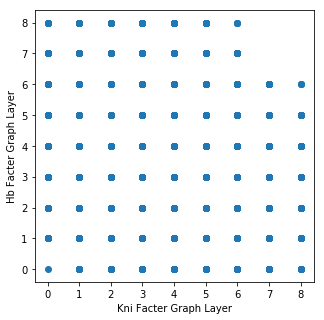

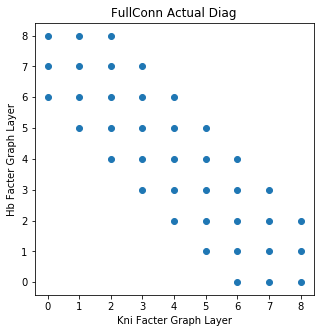

1253 3286


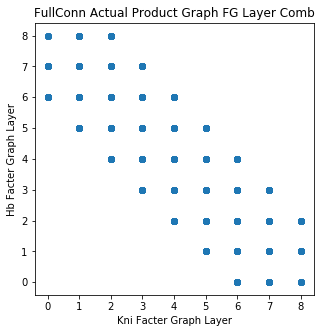

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_FullConn")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
print('r grad size', len(G), len(G.edges()))

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)
print('cond size', len(cG), len(cG.edges()))

P = get_product_graph(database, cG, scc, FP_Poset)
print('prod size', len(P), len(P.edges()))

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)
plot_FG_layer_comb(keep, Hb_max, breaks, 'FullConn Actual Diag')

del_list = []
for node in P:
    if scc[node][0][0:2] not in keep:
        del_list.append(node)

for node in del_list:
    P.remove_node(node)

print(len(del_list), len(P))
plot_FG_layer_comb_in_G(P, scc, Hb_max, 'FullConn Actual Product Graph FG Layer Comb')

In [ ]:
graphml_filename =  "FullConn_source.graphml"
get_gephi_graph_for_cond(database, network, G, graphml_filename)

In [ ]:
network_txt_filename = '/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/ACDC_StrongEdges'
with open(network_txt_filename,"r") as f:
        network = f.read()
print(network)

Hb : (Gt)(~Kni)       
Gt : (Kni)(~Kr)       
Kr : (~Kni)(~Gt)      
Kni : (~Hb)(~Gt)



Path exists from 7503 to 0


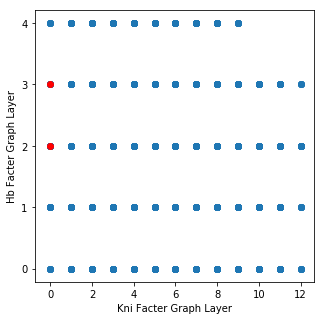

True

In [ ]:
test_any_path_exists_in_product(network, network_filename='StrongEdges') #14 min to compute grad graph

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/StrongEdges.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_StrongEdges")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/StrongEdges.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]

score_region_transitions(database, G, FP_Regions)

pg size 3240000
grad size 847811


0.4172286016420649

pg size 3240000
grad size 847811
r grad size 847811 7154684
cond size 7506 43002
prod size 2224 9041
2.4613020700085073


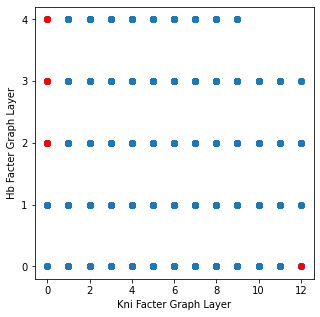

(1, 0) (0, 0)
(2, 0) (1, 0)


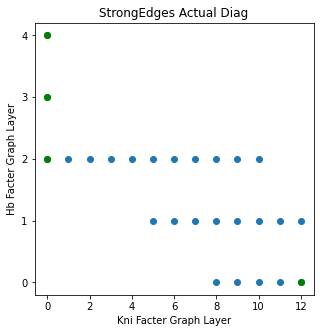

In [ ]:
with open('/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/StrongEdges.txt',"r") as f:
        network = f.read()
net = DSGRN.Network(network)
pg = ParameterGraph(net)
print('pg size', pg.size())

grad_graph = load_json("/home/elizabeth/Desktop/GIT/dsgrn_acdc/notebooks/grad_graph_strict_StrongEdges")
print('grad size', len(grad_graph))

database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/StrongEdges.db") 
out_edges = get_number_out_edges_from_string(network)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
print('r grad size', len(G), len(G.edges()))

strongcc = strongly_connected_components_by_MGI(G, database)
cG, scc = condensation(G, strongcc)
print('cond size', len(cG), len(cG.edges()))

P = get_product_graph(database, cG, scc, FP_Poset)
print('prod size', len(P), len(P.edges()))

nodelist = list(sorted(P.nodes()))
data = None
k = 8

Y, cut, clusters = asym_optimized_normalized_cut(P, k, nodelist, data)
print(cut)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1
breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 
keep = build_diag(Hb_max, Kni_max, breaks)


                
plot_FG_layer_comb(keep, Hb_max, breaks, 'StrongEdges Actual Diag')

In [ ]:
len(P)

2224

In [ ]:
graphml_filename =  "StrongEdges_source.graphml"
get_gephi_graph_for_cond(database, network, G, graphml_filename)

### Then we can restrict to a diagonal, and increase that diagonal to include the breaking points.

I include breaking points into the diagonal as minimilly as possible, since all paths will have to go through these nodes, adding more to keep symmetry wont add any information.

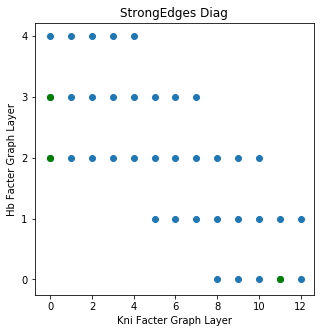

In [ ]:
keep = build_diag(Hb_max, Kni_max, breaks)
plot_FG_layer_comb(keep, Hb_max, breaks, 'StrongEdges Diag')

In [ ]:
del_list = []
for node in P:
    if scc[node][0][0:2] not in keep:
        del_list.append(node)

for node in del_list:
    P.remove_node(node)

print(len(del_list), len(P))

1126 3349


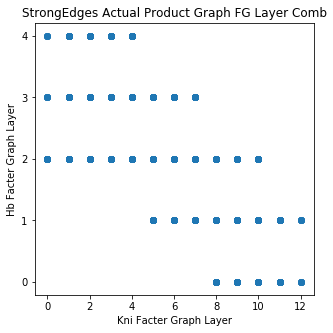

In [ ]:
plot_FG_layer_comb_in_G(P, scc, Hb_max, 'StrongEdges Actual Product Graph FG Layer Comb')

### Doing the same thing for FullConn

In [ ]:
database = Database("/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.db") 
grad_graph = load_json('/home/elizabeth/Desktop/GIT/dsgrn_acdc/src/grad_graph_strict_FullConn')
len(grad_graph)

1568352

In [ ]:
network_txt_filename = '/home/elizabeth/Desktop/GIT/dsgrn_acdc/networks/FullConn.txt'
with open(network_txt_filename,"r") as f:
        network = f.read()
print(network)


            Hb : (~Kr)(~Kni)   
            Gt : (~Hb)(~Kr)     
            Kr : (~Gt)(~Kni)   
            Kni : (~Hb)(~Gt)


In [ ]:
out_edges = get_number_out_edges_from_string(network)
print(out_edges)
FP_Poset, FP_Regions = get_FP_Poset(out_edges)
H = convert_dict_to_networkx(FP_Poset)
save_networkx_as_png(H, 'FP_Poset.png')

G = reduce_gradient_graph_to_nodes_of_interest(database, grad_graph, FP_Poset)[0]
strongcc = strongly_connected_components_by_MGI(G, database)
print(len(strongcc))
cG, scc = condensation(G, strongcc)

Hb_list, Kni_list = get_Hb_Kni_list(database)
Hb_max = len(Hb_list)-1
Kni_max = len(Kni_list)-1

{'Hb': 2, 'Gt': 2, 'Kr': 2, 'Kni': 2}
5311


In [ ]:
P = get_product_graph(database, cG, scc, FP_Poset)

In [ ]:
len(P)

1810

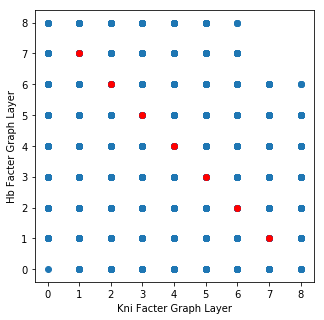

In [ ]:
breaks = find_breaks_in_FG_comb(database, P, scc, Hb_max, Kni_max, FP_Regions) 

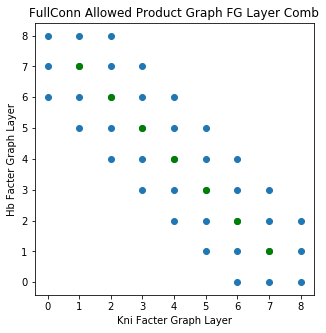

In [ ]:
keep = build_diag(Hb_max, Kni_max, breaks)
plot_FG_layer_comb(keep, Hb_max, breaks, 'FullConn Allowed Product Graph FG Layer Comb')

In [ ]:
del_list = []
for node in P:
    if scc[node][0][0:2] not in keep:
        del_list.append(node)

for node in del_list:
    P.remove_node(node)

print(len(del_list), len(P))

0 1810


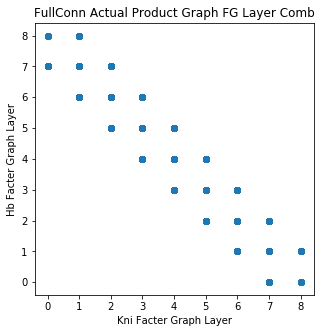

In [ ]:
plot_FG_layer_comb_in_G(P, scc, Hb_max, 'FullConn Actual Product Graph FG Layer Comb')

In [ ]:
start_set, stop_set = return_start_stop_set(database, P, scc, Hb_max, Kni_max, FP_Regions)
print(start_set, stop_set)

[2414, 2415, 2416] [2, 3]
